# Ovrlpy applied to vizgen receptor data map



#### Imports:

In [1]:
%load_ext autoreload
%autoreload 2

#### Parameter definition:

In [2]:
import os
# from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# from sklearn.neighbors import NearestNeighbors
import anndata
import time

perf = time.perf_counter()
perf_ = perf

print(time.perf_counter()-perf)


6.036600098013878e-05


In [3]:
n_slice = 2

coordinate_path = f'/dh-projects/ag-ishaque/raw_data/vizgen-merfish/vz-receptor-showcase/Slice{n_slice}/Replicate1/detected_transcripts_S{n_slice}R1.csv'
# analysis/tiesmeys/data/vizgen-merfish/vz-receptor-showcase/Slice1/Replicate1/detected_transcripts_S1R1.csv'

scale=1 # scaling factor for images/coordinats. We want to end up with cell diameter ~30px (cellpose default)
# model_type='cyto2' # cellpose model name. ['dapi','cyto','cyto2']

In [4]:

# {0:'xenium_mouse_brain',1:'merfish_mouse_brain',2:'merfish_liver'}
dataset =0

file_root = '/dh-projects/ag-ishaque/analysis/tiesmeys/spot-data-z-axis-incoherence/src'


           global_x      global_y      global_z
count  4.874067e+07  4.874067e+07  4.874067e+07
mean   4.974135e+03  3.696136e+03  2.847259e+00
std    2.237596e+03  1.731014e+03  1.945633e+00
min    5.302726e+01 -7.666222e+01  0.000000e+00
25%    3.236294e+03  2.256036e+03  1.000000e+00
50%    4.957519e+03  3.637856e+03  3.000000e+00
75%    6.799679e+03  5.120410e+03  4.000000e+00
max    9.692914e+03  7.453246e+03  6.000000e+00
n_transcripts: 48574461, panel_size: 483


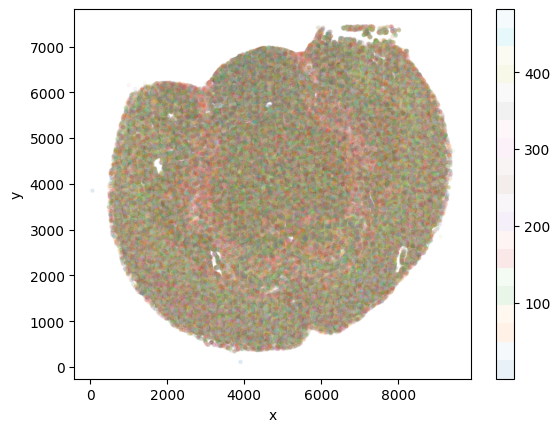

In [5]:
# Load coordinate_path data frame, read only the columns
# global_x, global_y, global_z, fov	gene:

import time

df = pd.read_csv(coordinate_path, sep=',', usecols=[2,3,4,8], header=0)[::1]

print(df.describe())


df.columns=['x','y','z','gene']
df = df[~df.gene.str.contains('Blank')]
# df.x-=df.x.min()
# df.y-=df.y.min()
# df.x/=um_per_pixel/scale
# df.y/=um_per_pixel/scale
# df.z/=um_per_pixel/scale

# df.gene.replace({'Acte1':'Gm498'})

df.gene = df.gene.astype('category')
gene_counts = df.gene.value_counts()
genes = list(gene_counts.index)

df[::200].plot.scatter(x='x',y='y',s=5,c=df[::200].gene.cat.codes,cmap='tab20',alpha=0.1)

print(f"n_transcripts: {len(df)}, panel_size: {len(genes)}")

In [6]:
signatures_ = pd.read_csv('/dh-projects/ag-ishaque/raw_data/Xenium-benchmark/scRNAseq/trimmed_means.csv',index_col=0)

signatures_ = signatures_.T.groupby(lambda x: x.split('_')[1].split(' ')[0].split('-')[0]).apply(lambda x: x.mean(0)).T

signatures = pd.DataFrame(index=genes,columns=signatures_.columns)
signatures = signatures.fillna(0.0)

for gene in genes:
    if gene in signatures_.index:
        signatures.loc[gene] = signatures_.loc[gene]

del signatures_ 
signatures.columns=signatures.columns.str.replace('/','-')


/tmp/ipykernel_453804/2048503760.py:6: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  signatures = signatures.fillna(0.0)


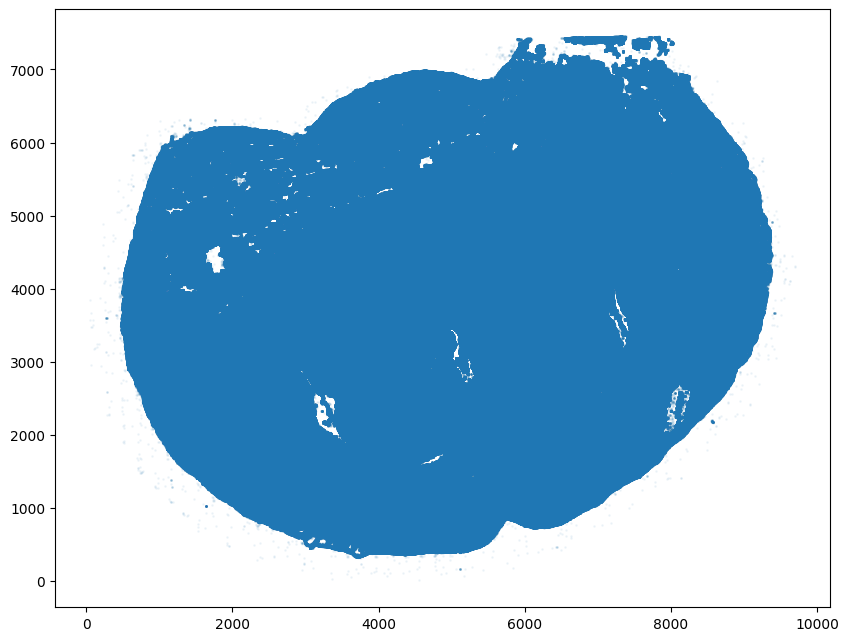

In [7]:
import ovrlpy

plt.figure(figsize=(10,10))


x_lims = [0,10000]
y_lims = [0,10000]

df_mask = (df.x>x_lims[0]) & (df.x<x_lims[1]) & (df.y>y_lims[0]) & (df.y<y_lims[1])

df = df[df_mask].copy()

mins = df[['x','y']].min()

# df.x-=df.x.min()
# df.y-=df.y.min()

plt.scatter(df.x,df.y,s=1,alpha=0.05)
plt.gca().set_aspect('equal') 
df.gene = df.gene.astype('str').astype('category')
gene_counts = df.gene.value_counts()
genes = gene_counts.index

# Adhere to project's global naming convention:
coordinate_df = df.copy()
del df

ovrlpy.pre_process_coordinates(coordinate_df)


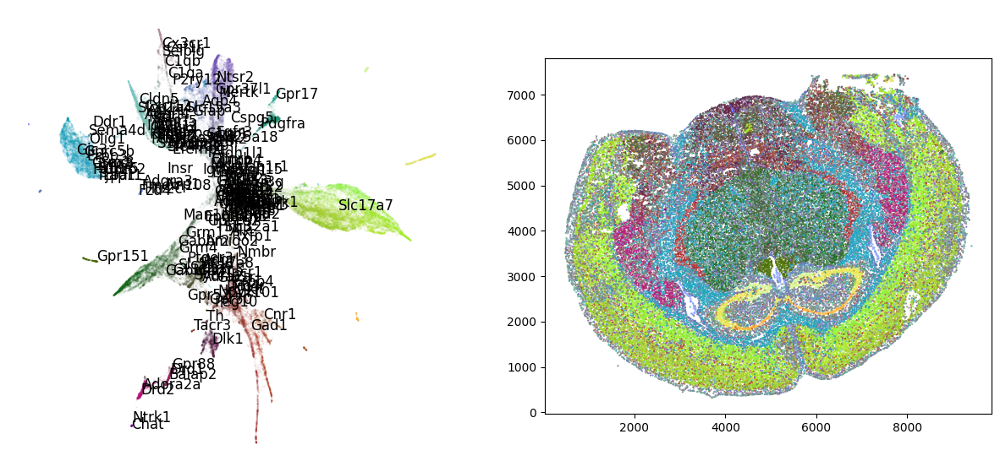

In [8]:
import ovrlpy

visualizer = ovrlpy.load_visualizer('./publication/vizgen-receptor/vizgen-receptor.vis')

signal_integrity,signal_strength = visualizer.integrity_map,visualizer.signal_map

visualizer.plot_fit()

/tmp/ipykernel_453804/1398008384.py:9: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  signatures = signatures.fillna(0.0)


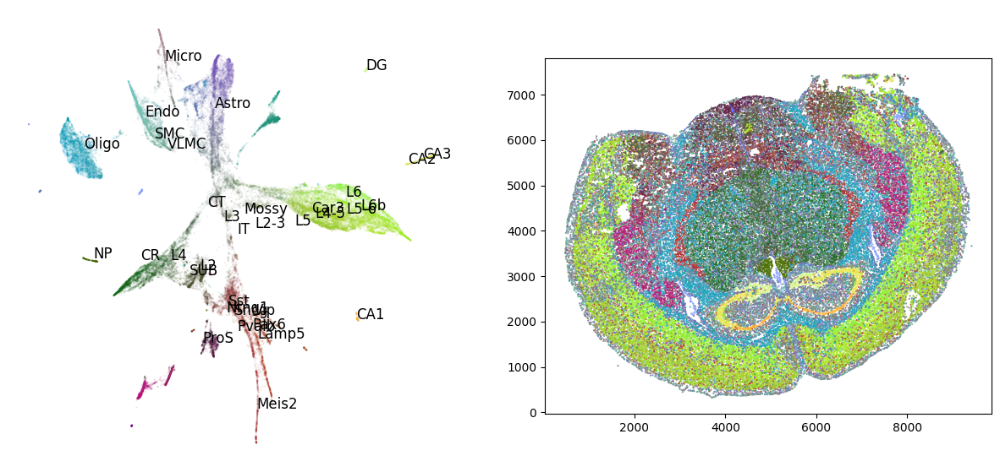

In [9]:
import numpy as np
import matplotlib.pyplot as plt

signatures_ = pd.read_csv('/dh-projects/ag-ishaque/raw_data/Xenium-benchmark/scRNAseq/trimmed_means.csv',index_col=0)

signatures_ = signatures_.T.groupby(lambda x: x.split('_')[1].split(' ')[0].split('-')[0]).apply(lambda x: x.mean(0)).T

signatures = pd.DataFrame(index=visualizer.genes,columns=signatures_.columns)
signatures = signatures.fillna(0.0)

for gene in visualizer.genes:
    if gene in signatures_.index:
        signatures.loc[gene] = signatures_.loc[gene]

del signatures_ 

signatures.columns=signatures.columns.str.replace('/','-')

visualizer.fit_signatures(signatures)

visualizer.plot_fit()

plt.savefig("./publication/vizgen-receptor/figures/receptor-fit",dpi=300)

In [60]:


doublet_df = ovrlpy.detect_doublets(
    signal_integrity, signal_strength, minimum_signal_strength=5, integrity_sigma=2
)

doublet_df

The history saving thread hit an unexpected error (OperationalError('unable to open database file')).History will not be written to the database.


,x,y,integrity,signal
0,1933,2384,0.918411,5.035690
1,8565,4552,0.873807,5.063889
2,6734,4444,0.858116,5.134049
3,3424,947,0.856493,5.084096
4,7889,4967,0.838146,5.242637
...,...,...,...,...
64,5030,3311,0.708985,5.241282
65,7978,3104,0.707823,5.035203
66,8254,4403,0.707246,5.203395
67,2965,2639,0.704217,5.140669


#### load cell boundaries

In [30]:
import h5py as h5
from shapely.geometry import Polygon
import rasterio
from rasterio.features import rasterize
import tqdm

File_features = h5. "/dh-projects/ag-ishaque/analysis/tiesmeys/src/ovrlpy/publication/vizgen-receptor/mapmycells]$ ls /dh-projects/ag-ishaque/raw_data/vizgen-merfish/vz-receptor-showcase/Slice1/Replicate1/cell_boundaries"

polygons = [[] for i in range(12)]

max_x = 0
max_y = 0

cell_id = 0

files = os.listdir(f'/dh-projects/ag-ishaque/raw_data/vizgen-merfish/vz-receptor-showcase/Slice{n_slice}/Replicate1/cell_boundaries/')

boundaries = []

for file in tqdm.tqdm(files,total = len(files)):
    with h5.File(f'/dh-projects/ag-ishaque/raw_data/vizgen-merfish/vz-receptor-showcase/Slice{n_slice}/Replicate1/cell_boundaries/{file}','r') as f:
        
        for i, features in enumerate (f['featuredata'].keys()):
            for j,idx_key in enumerate(f['featuredata'][features].keys()):
                
                if (isinstance(f['featuredata'][features][idx_key],h5.Dataset)):
                    # print(f['featuredata'][features][idx_key])
                    continue
                    # plt.plot(*f['featuredata'][features][idx_key]['coordinates'][0].T)

                else:
                    for m,p in enumerate(f['featuredata'][features][idx_key].keys()):                        
                        
                        polygon = Polygon(f['featuredata'][features][idx_key][p]['coordinates'][0])
                        polygons[int(idx_key.split('_')[-1])].append((polygon, cell_id))  
                        
                        max_x = max(max_x,f['featuredata'][features][idx_key][p]['coordinates'][0][:,0].max())
                        max_y = max(max_y,f['featuredata'][features][idx_key][p]['coordinates'][0][:,1].max())
                        
                        boundaries.append(pd.DataFrame(f['featuredata'][features][idx_key][p]['coordinates'][0],columns=['x','y']))
                        boundaries[-1]['cell_id'] = cell_id
                        boundaries[-1]['z_index'] = int(idx_key.split('_')[-1])
                        
                        # plt.plot(*f['featuredata'][features][idx_key][p]['coordinates'][0].T)
                        
            cell_id+=1
            

segmentation_maps = {i:rasterize(p, out_shape=(int(max_y+20),int(max_x+20)), fill=np.nan, all_touched=True, dtype=float) for i,p in enumerate(polygons) if len(p)>0}

overlaps = -np.ones_like(segmentation_maps[0])

for i,seg in segmentation_maps.items():
    overlap = (seg!=overlaps)&(overlaps!=-1)&(~np.isnan(seg))
    new_entry = (overlaps==-1)&(~np.isnan(seg))
    overlaps[overlap] = -2
    overlaps[new_entry] = seg[new_entry]
    

boundary_df = pd.concat(boundaries)



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1242/1242 [10:03<00:00,  2.06it/s]


['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

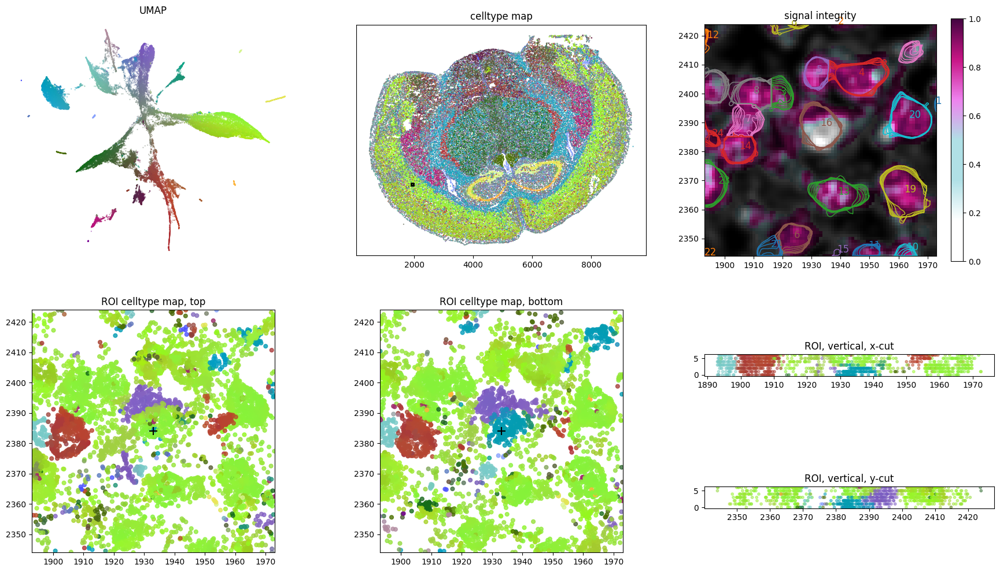

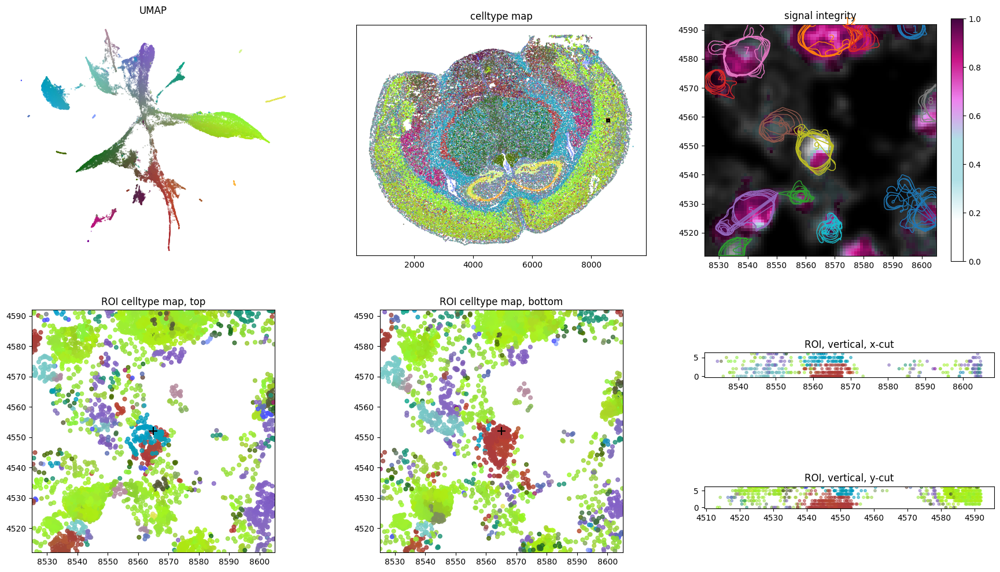

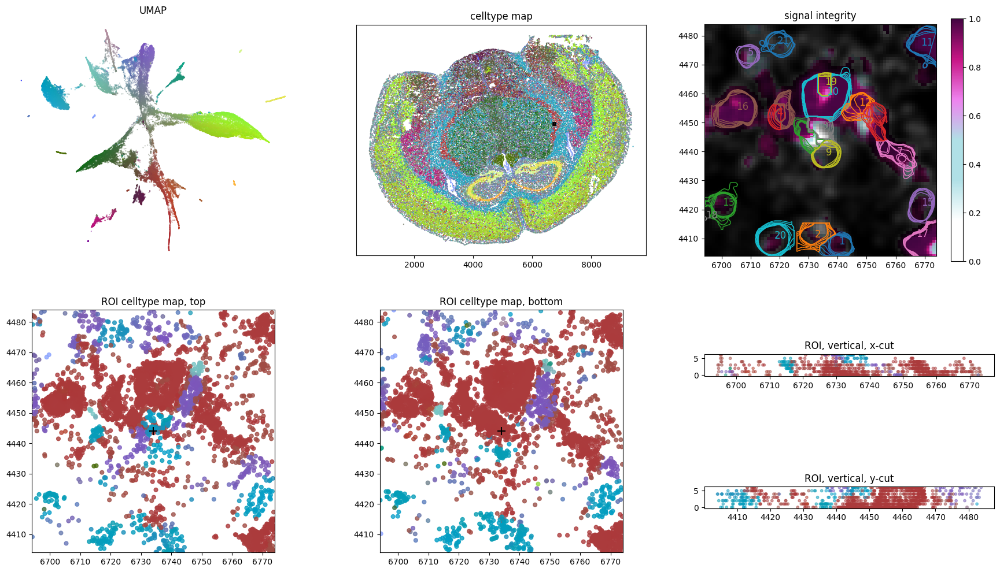

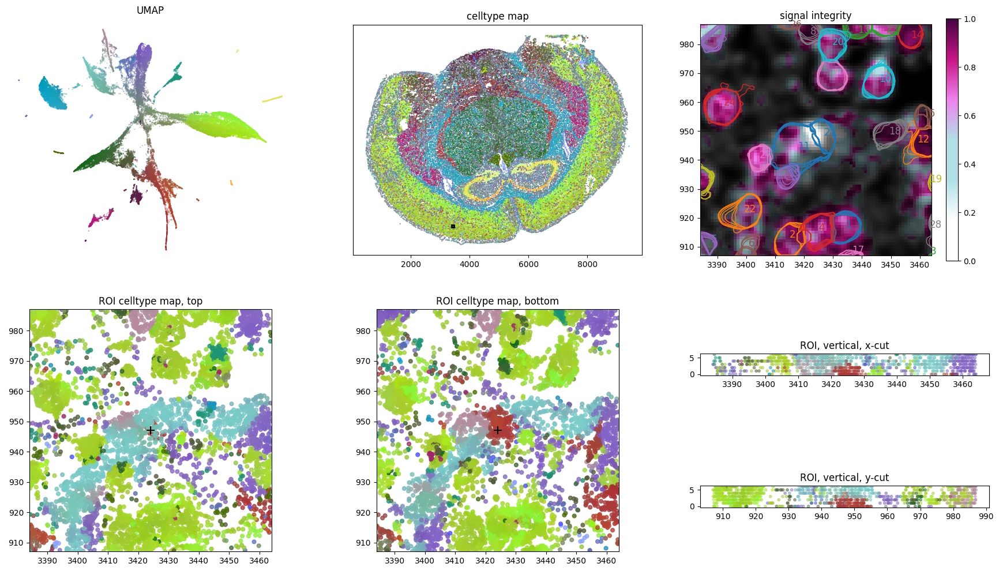

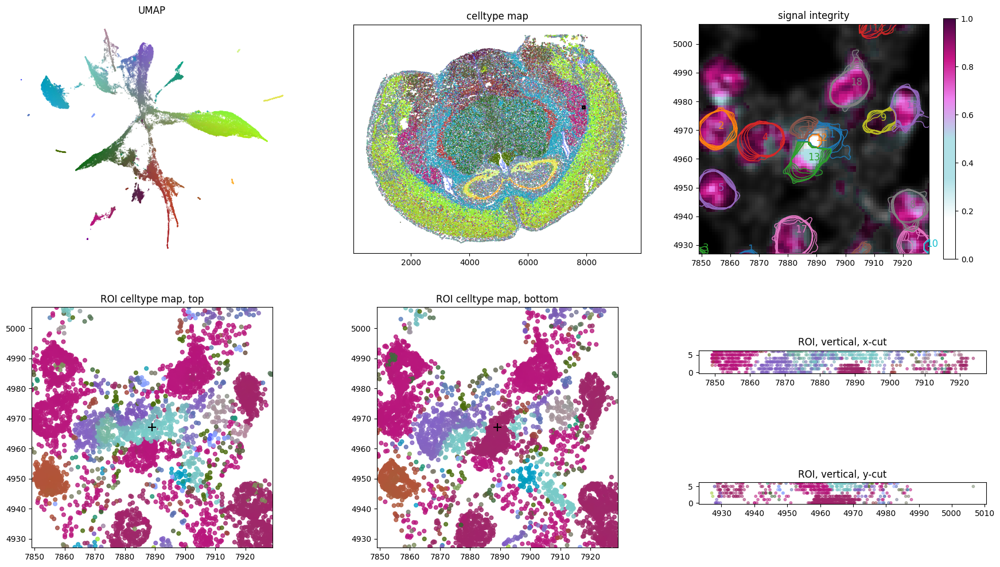

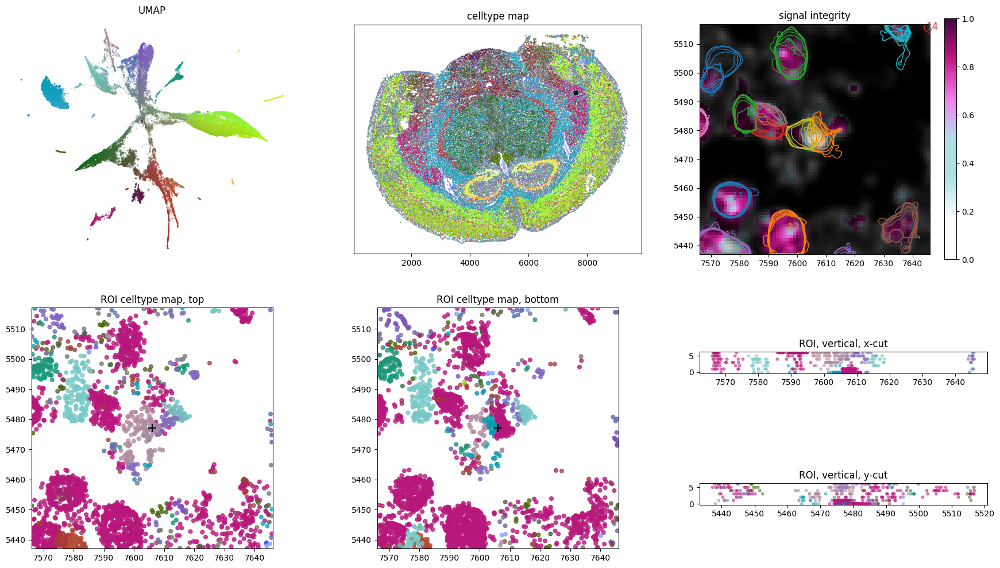

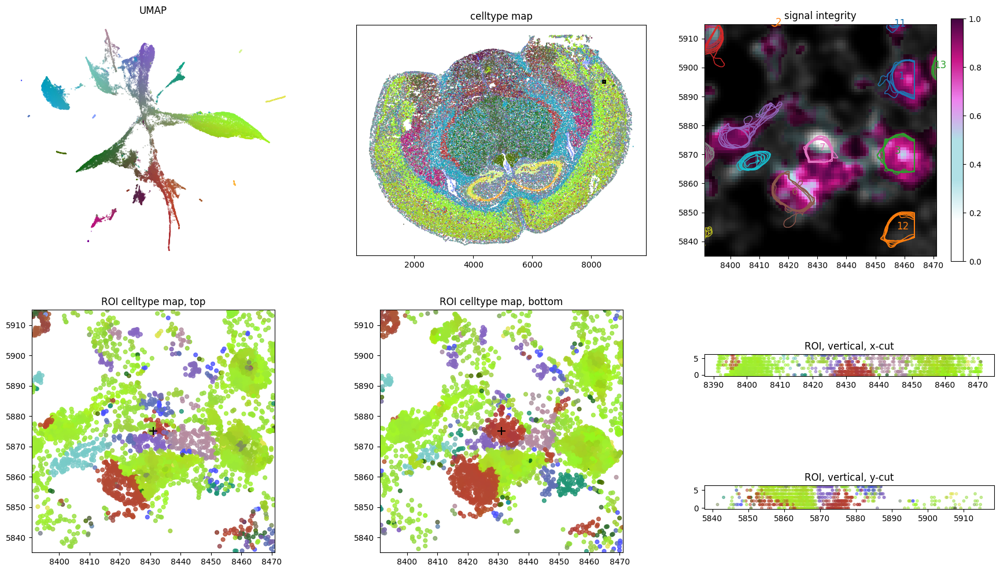

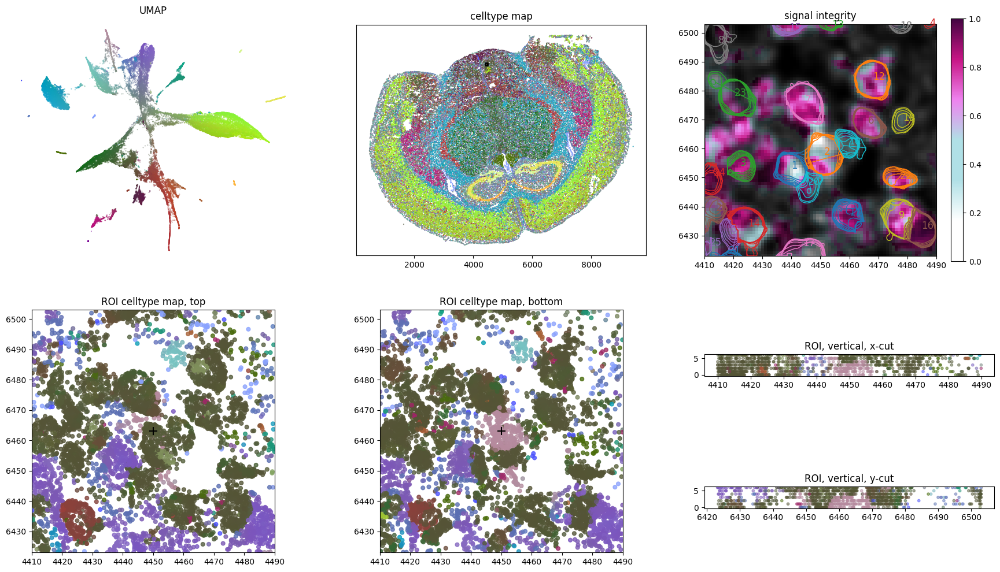

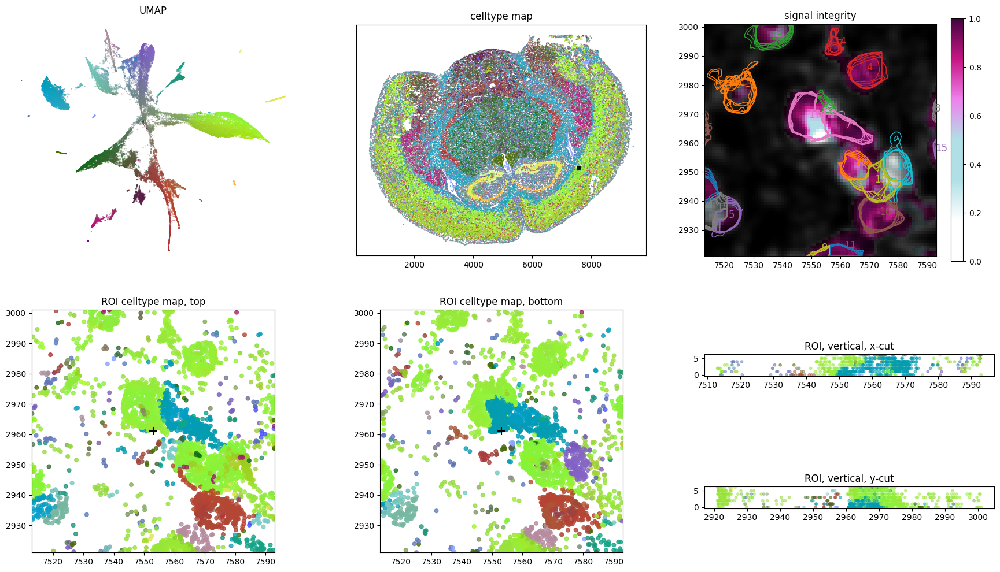

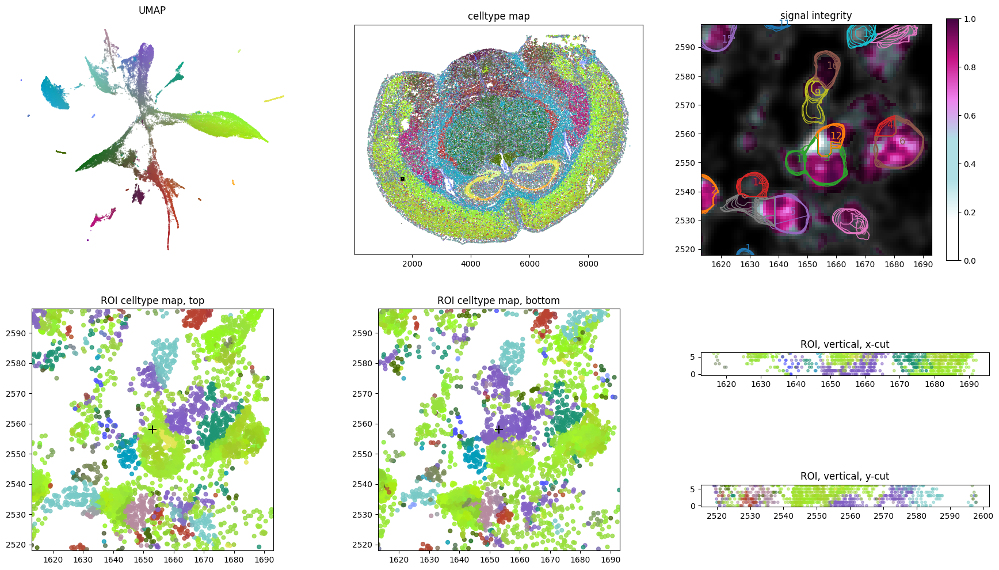

In [61]:
window_size = 40

# def plot_cells(x,y,window_size,ax=None):
    
#     if ax is None:
#         ax = plt.gca()
    
#     x_,_x = x-window_size,x+window_size
#     y_,_y = y-window_size,y+window_size
    
#     boundary_subset = boundary_df[(boundary_df.x.between(x_,_x))&(boundary_df.y.between(y_,_y))]
    
#     cells_present = boundary_subset.cell_id.unique()
    
#     for i,c in enumerate(cells_present):
        
#         boundary_subset_cell = boundary_subset[boundary_subset.cell_id==c]
        
#         for z in boundary_subset_cell.z_index.unique():
            
#             boundary_subset_z = boundary_subset_cell[boundary_subset_cell.z_index==z]
            
#             ax.plot(boundary_subset_z.x,boundary_subset_z.y,c=[0,1-(z/boundary_df.z_index.max()),z/boundary_df.z_index.max()],linewidth=1)
   
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
   
def plot_cells(x,y,window_size,ax=None):
    
    if ax is None:
        ax = plt.gca()
    
    x_,_x = x-window_size,x+window_size
    y_,_y = y-window_size,y+window_size
    
    boundary_subset = boundary_df[(boundary_df.x.between(x_,_x))&(boundary_df.y.between(y_,_y))]
    
    cells_present = boundary_subset.cell_id.unique()
    
    for i,c in enumerate(cells_present):
        
        boundary_subset_cell = boundary_subset[boundary_subset.cell_id==c]
        
        cell_center = boundary_subset_cell[['x','y']].mean()
        
        txt = ax.text(cell_center.x,cell_center.y,f'{i+1}',fontsize=12,color=colors[i%len(colors)])
        
        
        for z in boundary_subset_cell.z_index.unique():
            
            boundary_subset_z = boundary_subset_cell[boundary_subset_cell.z_index==z]
            
            ax.plot(boundary_subset_z.x,boundary_subset_z.y,c=colors[i%len(colors)],linewidth=1)
            

for doublet_case in range(10):
    x, y = doublet_df.loc[doublet_case, ["x", "y"]]

    fig, axes = ovrlpy.plot_region_of_interest(
        x,
        y,
        coordinate_df,
        visualizer,
        signal_integrity,
        signal_strength,
        window_size=window_size,
    )
    
    plot_cells(x,y,window_size,axes[0][2])

    # plt.savefig(f'./publication/vizgen-receptor/figures/doublet-case-visualizations/receptor_doublet_case_{doublet_case+1}.svg',dpi=300)